<a href="https://colab.research.google.com/github/claradelboni/MVP_BreastCancer/blob/main/MVP_BreastCancer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Pós-graduação em Data Science e Analytics**

## **MVP Sprint 2: Treinar modelos de machine learning para um problema de classificação**

### Clara Gouveia da Silva Delboni

# Sumário

1.   Introdução do dataset e definição do problema
2.   Dicionário dos atributos do dataset
3.   Coleta e análise de dados
4.   Pré-processamento
5.   Modelagem e treinamento
6.   Avaliação de Resultados
7.   Conclusão



# 1. Introdução do dataset e definição do problema


O câncer de mama se caracteriza pelo crescimento descontrolado de células nas mamas e é uma das formas mais comuns de câncer entre as mulheres em todo o mundo, sendo uma das principais causas de morte feminina. Embora também possa afetar homens, o câncer de mama é predominantemente feminino. A descoberta precoce do câncer de mama é crucial para aumentar as chances de tratamento bem-sucedido e cura. Quando diagnosticado em estágios iniciais, as opções terapêuticas são mais eficazes, e a probabilidade de cura é significativamente maior.

O objetivo deste projeto é encontrar o melhor modelo de machine learning que aprenda com os dados de entrada apresentados abaixo, sendo capaz de identificar se o câncer é benigno ou maligno. O conjunto de dados foi obtido através do Kaggle, e o conteúdo foi elaborado para fins educacionais, a partir do dataset original - https://www.kaggle.com/datasets/uciml/breast-cancer-wisconsin-data). O dataset contém um ID único para cada paciente, o tipo de câncer (target: diagnóstico) e as características visuais do câncer, como média do perímetro e textura.

Por possuir pouco conhecimento sobre o assunto, trabalharei com os dados para ao longo do estudo levantar hipótes sobre o tema.


# 2. Dicionário dos atributos do dataset

Com exceção do ID e da target "Diagnosis", a média, o erro padrão e o "pior" ou maior das características do tumor foram calculados, resultando em 30 atributos.


Características "Mean": Médias estimadas

Características "Se": Erros-padrão

Características "Worst": Média dos três maiores valores.


*   ID - Número de ID do paciente
*   Diagnosis - Diagnóstico (M = maligno, B = benigno)

*   Raio - (média das distâncias do centro aos pontos no perímetro)
*   Textura (desvio padrão dos valores em escala de cinza)
*   Perímetro
*   Área
*   Suavidade (variação local nos comprimentos dos raios)
*   Compacidade (perímetro² / área - 1.0)
*   Concavidade (gravidade das porções côncavas do contorno
*   Pontos côncavos (número de porções côncavas do contorno)
*   Simetria
*   Fimensão fractal (aproximação da "linha costeira" - 1)




In [46]:
# Configuração para não exibir os warnings
import warnings
warnings.filterwarnings("ignore")

# Imports necessários
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from imblearn.over_sampling import SMOTE # para balanceamento
from sklearn.preprocessing import StandardScaler # para padronização
from sklearn.preprocessing import MinMaxScaler # para normalização
from sklearn.pipeline import Pipeline # para automatizar os fluxos de trabalho

from sklearn.model_selection import train_test_split # para particionar em bases de treino e teste (holdout)
from sklearn.model_selection import KFold # para preparar os folds da validação cruzada
from sklearn.model_selection import cross_val_score # para executar a validação cruzada
from sklearn.model_selection import GridSearchCV # para automatizar o processo de ajuste dos parâmetros do algoritmo

from sklearn import metrics
from sklearn.metrics import accuracy_score # para a exibição da acurácia do modelo
from sklearn.metrics import confusion_matrix # mariz de confusão
from sklearn.metrics import accuracy_score, classification_report #acurácia e relatório
from sklearn.metrics import accuracy_score, recall_score # acurácia e revocação

from sklearn.linear_model import LogisticRegression # algoritmo Regressão Logística
from sklearn.neighbors import KNeighborsClassifier # algoritmo KNN
from sklearn.tree import DecisionTreeClassifier # algoritmo Árvore de Classificação
from sklearn.naive_bayes import GaussianNB # algoritmo Naive Bayes
from sklearn.svm import SVC # algoritmo SVM

from sklearn.ensemble import BaggingClassifier # ensemble methods
from sklearn.ensemble import RandomForestClassifier # ensemble methods
from sklearn.ensemble import ExtraTreesClassifier # ensemble methods
from sklearn.ensemble import VotingClassifier # ensemble methods
from sklearn.ensemble import AdaBoostClassifier # ensemble methods
from sklearn.ensemble import GradientBoostingClassifier # ensemble methods

from sklearn.feature_selection import SelectKBest # para a Seleção Univariada
from sklearn.feature_selection import f_classif # para o teste ANOVA da Seleção Univariada
from sklearn.feature_selection import RFE # para a Eliminação Recursiva de Atributos

# 3. Coleta e análise de dados

In [47]:
df = pd.read_csv('https://raw.githubusercontent.com/claradelboni/MVP_BreastCancer/refs/heads/main/Cancer_Data.csv')

df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [48]:
# Excluindo as colunhas 'id' e 'Unnamed: 32' do dataset
df = df.drop(columns = ['id','Unnamed: 32'])
df.head(10)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678
5,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,0.2087,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440
6,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,0.1794,...,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368
7,M,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,0.2196,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.11510
8,M,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,0.2350,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.2060,0.4378,0.10720
9,M,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,0.2030,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.2210,0.4366,0.20750


In [49]:
# Mostra as dimensões do dataset
df.shape

(569, 31)

In [50]:
# Mostra as informações do dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

O dataset possui um número alto de colunas, porém poucas linhas.

In [51]:
df.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [52]:
df.isna().sum()

,0
diagnosis,0
radius_mean,0
texture_mean,0
perimeter_mean,0
area_mean,0
smoothness_mean,0
compactness_mean,0
concavity_mean,0
concave points_mean,0
symmetry_mean,0


In [53]:
# Verificando valores únicos
df.nunique()

,0
diagnosis,2
radius_mean,456
texture_mean,479
perimeter_mean,522
area_mean,539
smoothness_mean,474
compactness_mean,537
concavity_mean,537
concave points_mean,542
symmetry_mean,432


In [54]:
# Visualizando as estatísticas das colunas numéricas que a função describe() fornece
df.select_dtypes('number').describe().transpose()

,count,mean,std,min,25%,50%,75%,max
radius_mean,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
texture_mean,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
perimeter_mean,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
area_mean,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
smoothness_mean,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
compactness_mean,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
concavity_mean,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
concave points_mean,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
symmetry_mean,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400
fractal_dimension_mean,569.0,0.062798,0.007060,0.049960,0.057700,0.061540,0.066120,0.09744


<function matplotlib.pyplot.show(close=None, block=None)>

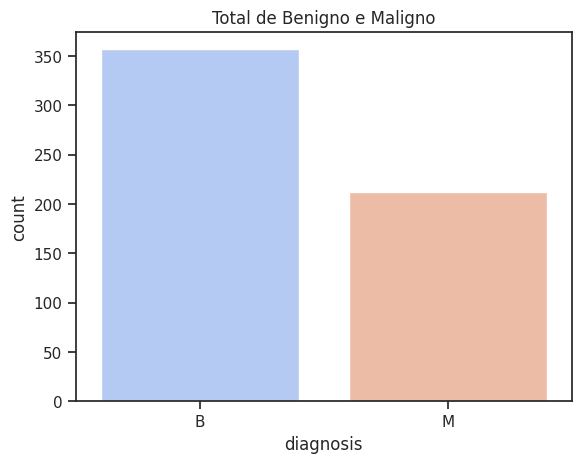

In [55]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

plt.subplot()
plt.title("Total de Benigno e Maligno")
sns.countplot(x='diagnosis', data=df, order = df['diagnosis'].value_counts().index, palette = "coolwarm")
plt.show

In [56]:
pd.DataFrame(df.diagnosis.value_counts())

,count
diagnosis,
B,357
M,212


Podemos verificar um leve desbalanceamento das classes da variável target, porém é preciso analisar melhor para identificar a necessidade de realização de um balanceamento.

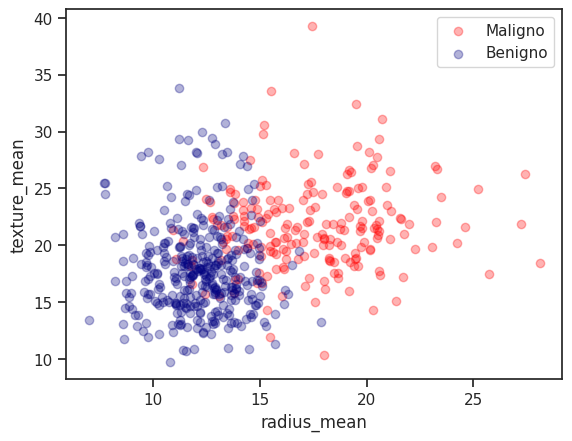

In [57]:
# Visualizando gráfico de dispersão da média da textura x média do raio

M = df[df.diagnosis == "M"]
B = df[df.diagnosis == "B"]

plt.scatter(M.radius_mean,M.texture_mean, color = "red", label = "Maligno", alpha = 0.3)
plt.scatter(B.radius_mean,B.texture_mean, color = "navy", label = "Benigno", alpha = 0.3)

plt.xlabel("radius_mean")
plt.ylabel("texture_mean")

plt.legend()
plt.show()

Neste primeiro gráfico, que mostra a relação entre duas características, é possível observar de forma inicial que os tumores benignos tendem a se concentrar em valores menores, enquanto os malignos estão associados a valores maiores. No entanto, é importante analisar os demais atributos com mais cuidado para evitar conclusões precipitadas.

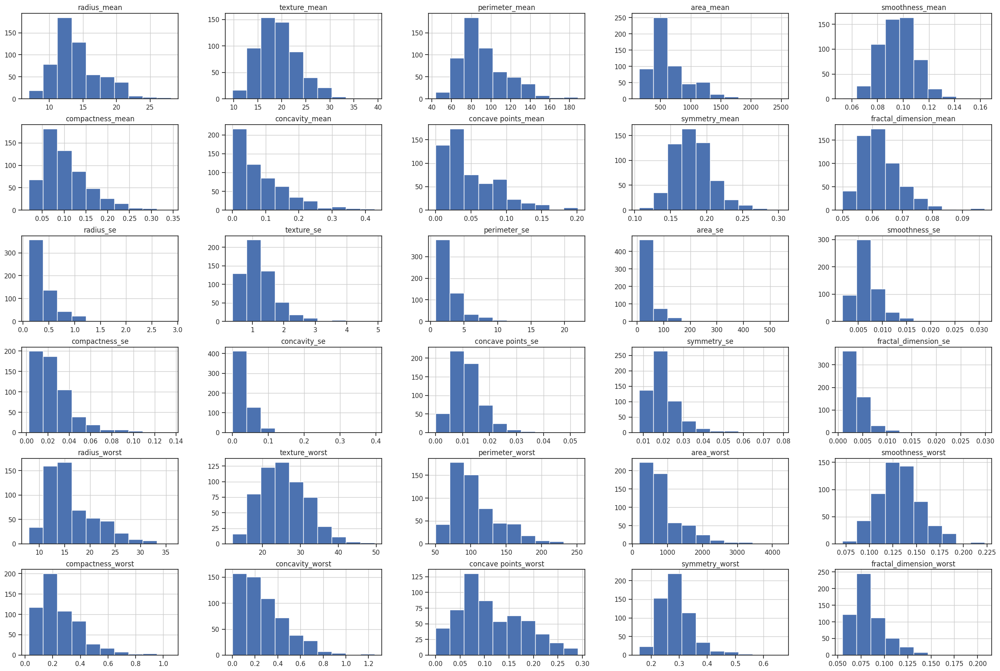

In [58]:
## Visualização dos atributos
# Histograma
df.hist(figsize = (30,20))
plt.show()

É possível visualizar através dos histogramas que algumas das variáveis no conjunto de dados possuem valores inteiros maiores, enquanto outras, valores bem mais baixos. Isso indica que seria interessante aplicar técnicas usadas para ajustar a escala das variáveis numéricas, como a normalização e padronização.

A Normalização ajusta os dados para um intervalo fixo (geralmente [0, 1]) e a
Padronização ajusta os dados para ter uma média de 0 e desvio padrão de 1.

In [59]:
# Dividindo o dataset em três diferentes datasets para melhor visualização

df_mean = df.iloc[:,1:11]
df_se = df.iloc[:,11:21]
df_worst = df.iloc[:,21:31]
df_mean['diagnosis'] = df.diagnosis
df_se['diagnosis'] = df.diagnosis
df_worst['diagnosis'] = df.diagnosis

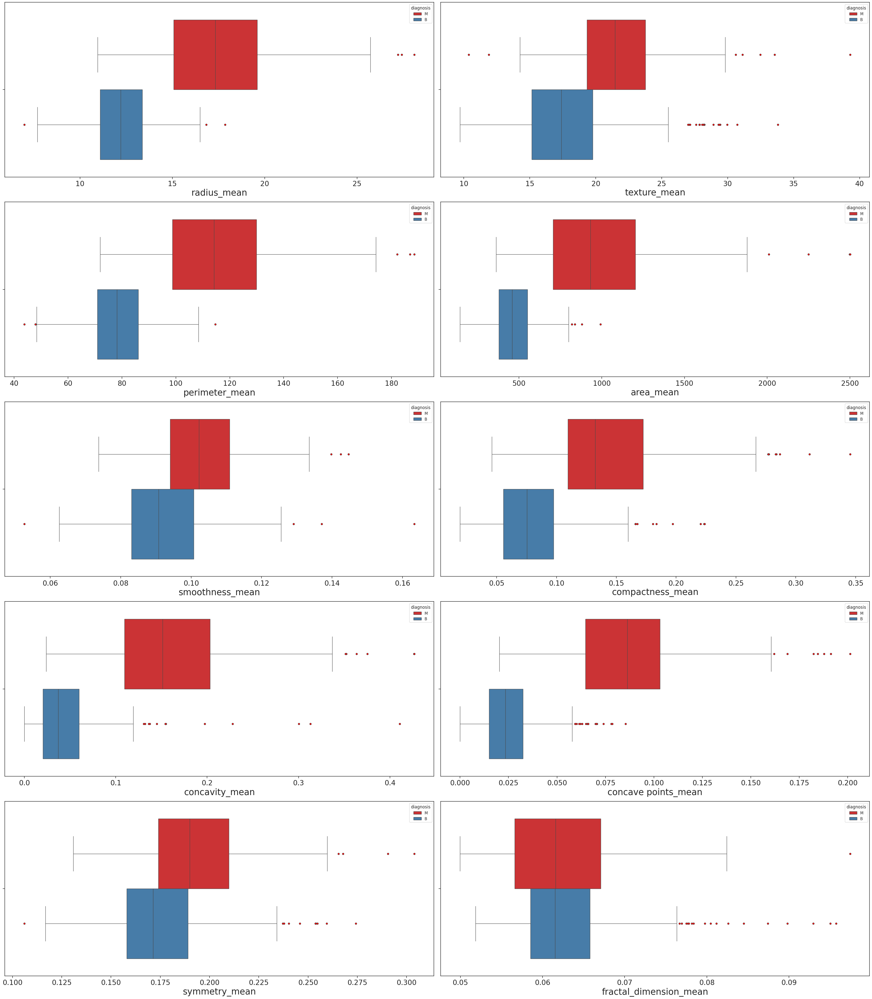

In [60]:
fig,axs = plt.subplots(ncols = 2, nrows = 5, figsize = (35,40), dpi = 100)
axs = axs.flatten()
for i,col in enumerate(df_mean.drop(columns = 'diagnosis').columns):
    sns.boxplot(data = df_mean, x = col, hue= 'diagnosis', ax=axs[i], palette='Set1', flierprops={'marker':'o', 'markersize':5, 'markerfacecolor':'red'})
    axs[i].set_xlabel(col,fontsize= 25)
    axs[i].tick_params(axis= 'x',labelsize = 20)

plt.tight_layout()
plt.show()

Os boxplots mostram que as médias das características da target seguem um padrão, com valores mais altos para tumores malignos e mais baixos para tumores benignos.

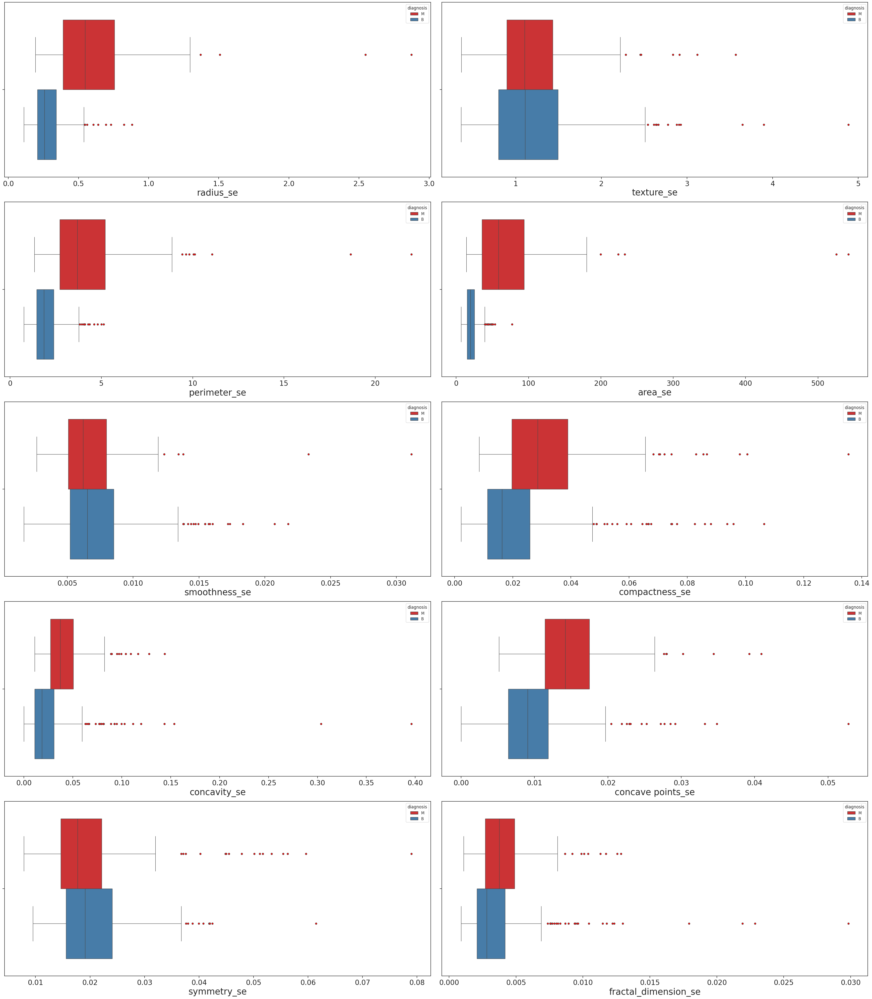

In [61]:
fig,axs = plt.subplots(ncols = 2, nrows = 5, figsize = (35,40), dpi = 100)
axs = axs.flatten()
for i,col in enumerate(df_se.drop(columns = 'diagnosis').columns):
    sns.boxplot(data = df_se, x = col, hue= 'diagnosis', ax=axs[i], palette='Set1', flierprops={'marker':'o', 'markersize':5, 'markerfacecolor':'red'})
    axs[i].set_xlabel(col,fontsize=25)
    axs[i].tick_params(axis= 'x', labelsize = 20)

plt.tight_layout()
plt.show()

Um boxplot de erro-padrão exibe o erro-padrão das médias das características da nossa target. O erro-padrão é uma medida da variabilidade ou dispersão das médias das amostras e os boxplots explorados acima demonstram que a classe "maligno" possui, geralmente, uma dispersão maior dos dados, quando comparada com a classe "benigno".

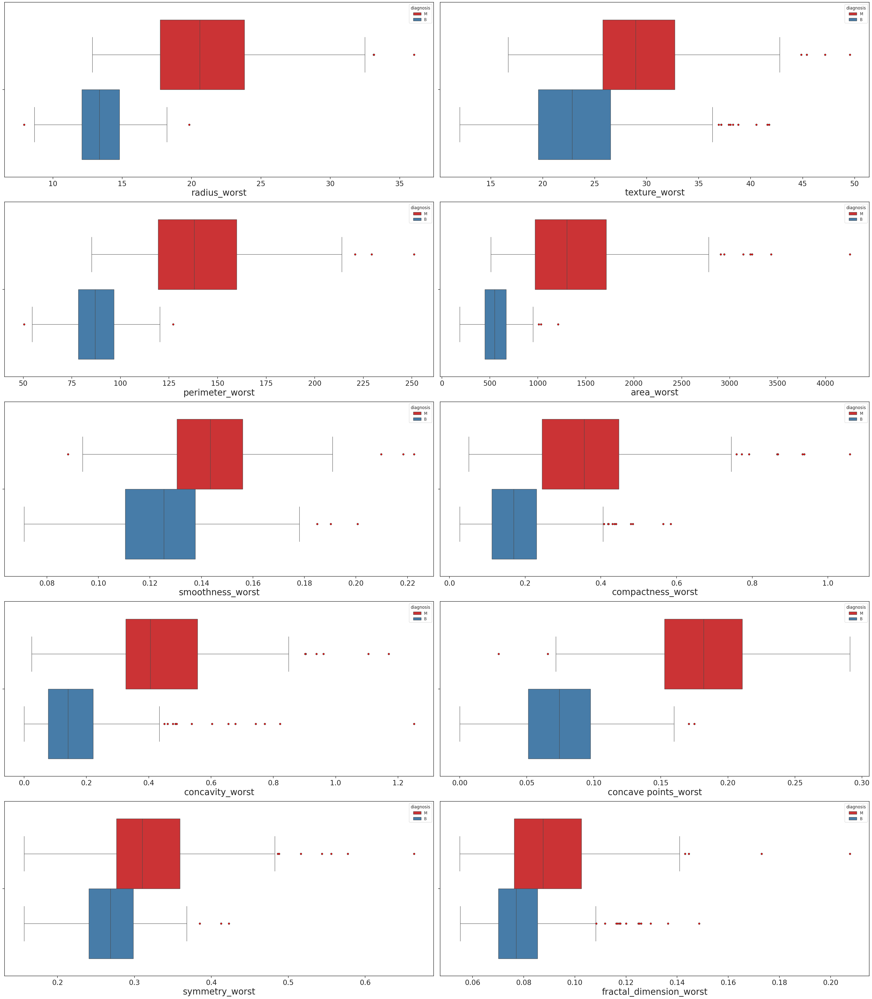

In [62]:
fig,axs = plt.subplots(ncols = 2, nrows = 5, figsize = (35,40), dpi = 100)
axs = axs.flatten()
for i,col in enumerate(df_worst.drop(columns = 'diagnosis').columns):
    sns.boxplot(data = df_worst, x = col, hue= 'diagnosis', ax=axs[i], palette='Set1', flierprops={'marker':'o', 'markersize':5, 'markerfacecolor':'red'})
    axs[i].set_xlabel(col,fontsize=25)
    axs[i].tick_params(axis= 'x', labelsize = 20)

plt.tight_layout()
plt.show()

Para as características "Worst", visualizamos novamente os maiores valores pertencendo à classe maligno.

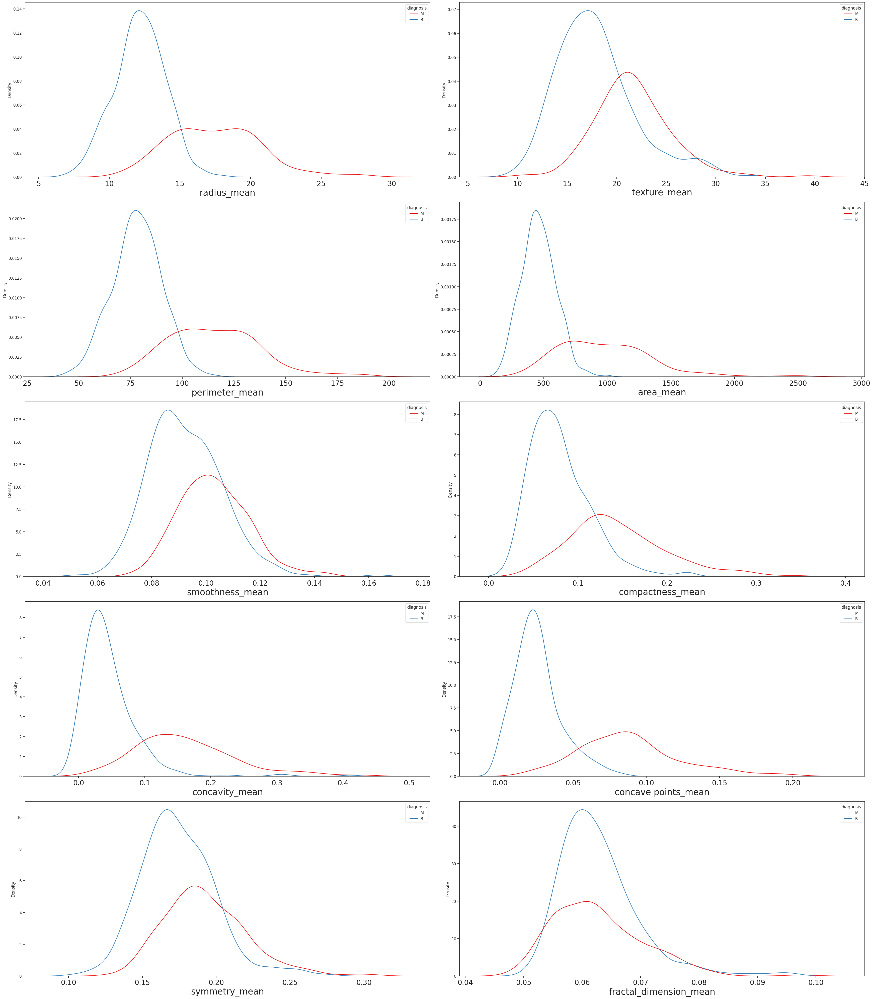

In [63]:
fig,axs = plt.subplots(ncols = 2, nrows = 5, figsize = (35,40), dpi = 100)
axs = axs.flatten()
for i,col in enumerate(df_mean.drop(columns = 'diagnosis').columns):
    sns.kdeplot(data = df_mean, x = col, hue= 'diagnosis', ax=axs[i], palette='Set1')
    axs[i].set_xlabel(col,fontsize=25)
    axs[i].tick_params(axis= 'x', labelsize = 20)

plt.tight_layout()
plt.show()


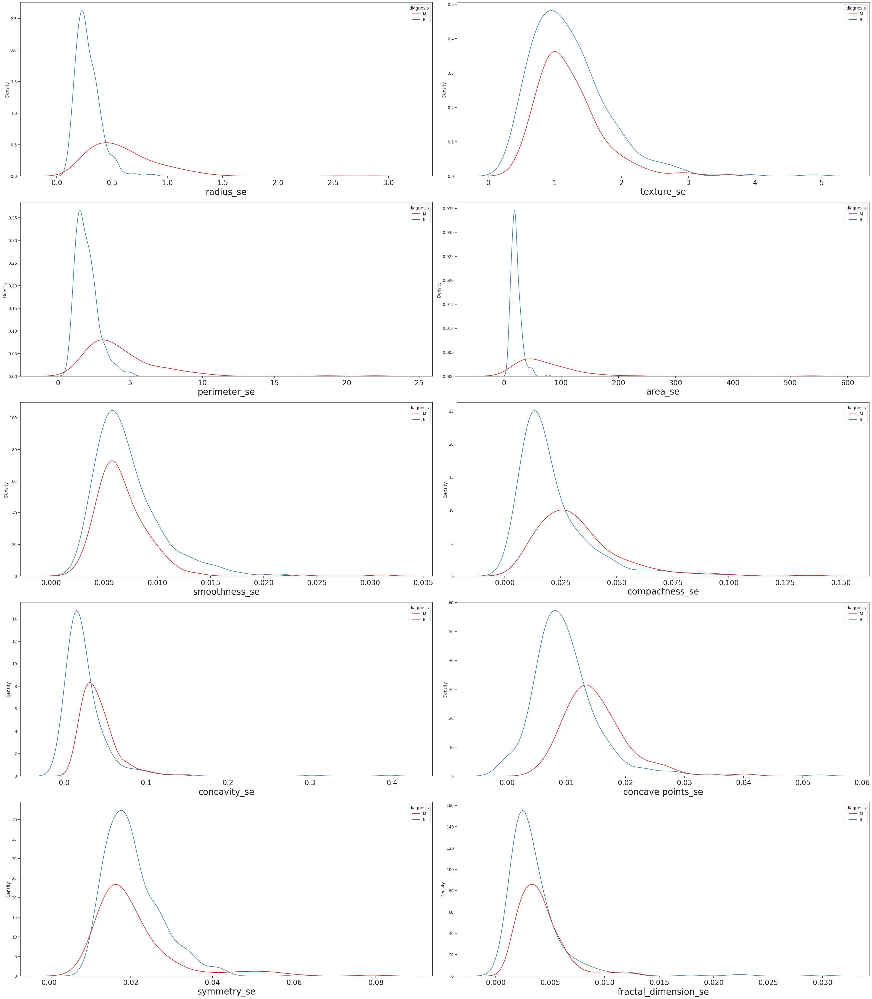

In [64]:
fig,axs = plt.subplots(ncols = 2, nrows = 5, figsize = (35,40), dpi = 100)
axs = axs.flatten()
for i,col in enumerate(df_se.drop(columns = 'diagnosis').columns):
    sns.kdeplot(data = df_se, x = col, hue= 'diagnosis', ax=axs[i], palette='Set1')
    axs[i].set_xlabel(col,fontsize=25)
    axs[i].tick_params(axis= 'x', labelsize = 20)

plt.tight_layout()
plt.show()

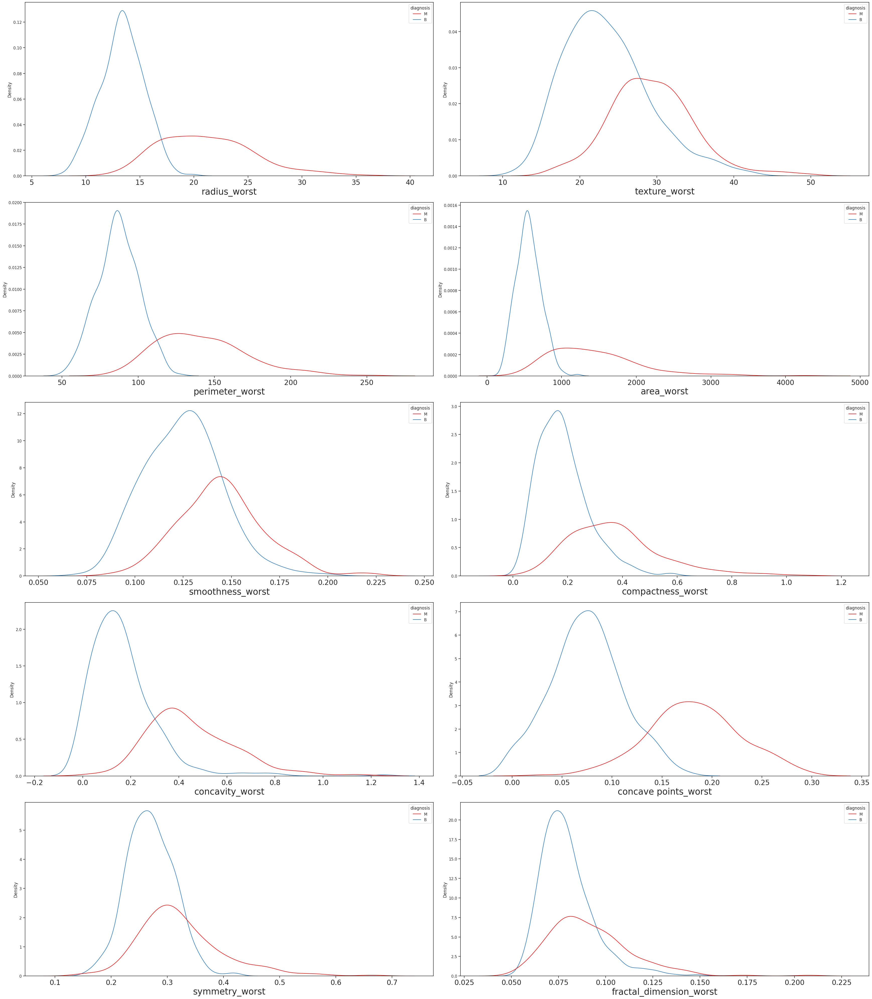

In [65]:
fig,axs = plt.subplots(ncols = 2, nrows = 5, figsize = (35,40), dpi = 100)
axs = axs.flatten()
for i,col in enumerate(df_worst.drop(columns = 'diagnosis').columns):
    sns.kdeplot(data = df_worst, x = col, hue= 'diagnosis', ax=axs[i], palette='Set1')
    axs[i].set_xlabel(col,fontsize=25)
    axs[i].tick_params(axis= 'x', labelsize = 20)

plt.tight_layout()
plt.show()

Agora, com uma versão suavizada do histograma, que mostra a distribuição de dados de forma mais contínua, visualizamos o KDE plot para os 3 conjuntos e "diagnosis" como hue, sendo "benigno" a linha azul e "maligno" a linha vermelha. Ficou evidente que a target "maligno" possui dados menos concentrados.

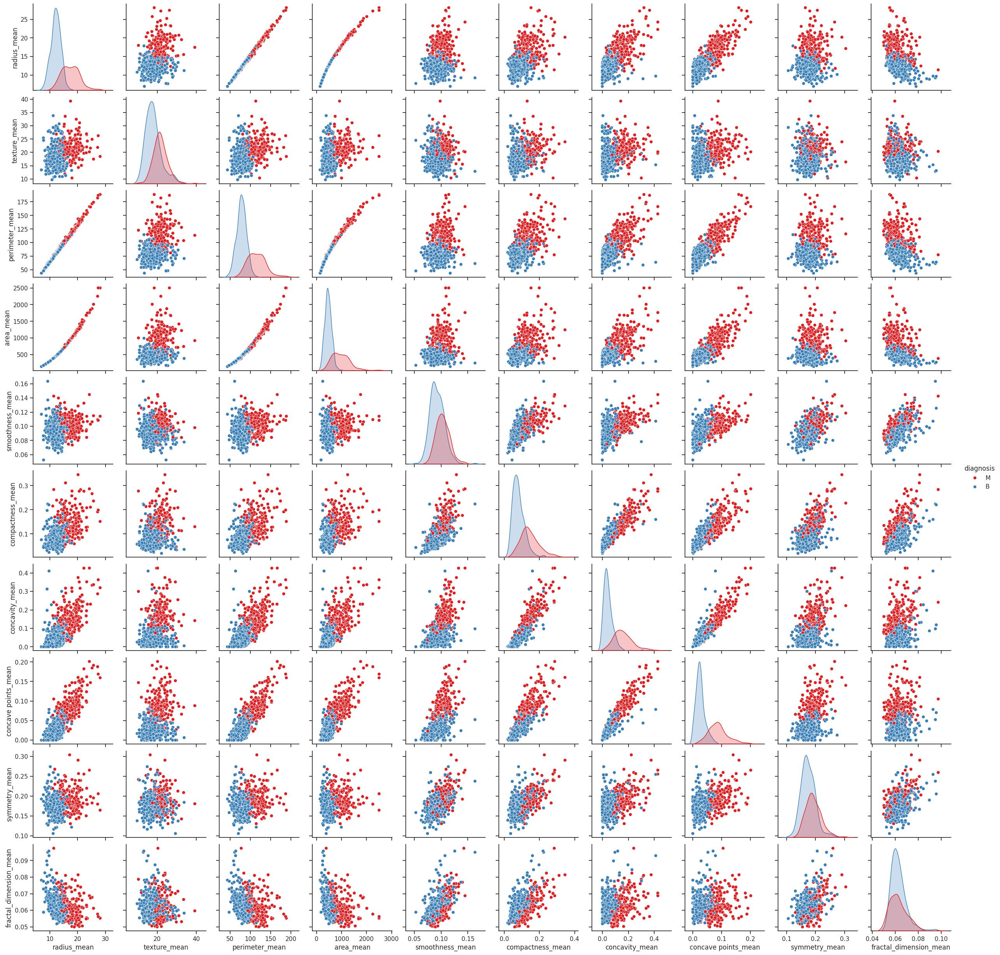

In [66]:
sns.set_theme(style="ticks")

sns.pairplot(df_mean, hue="diagnosis",  palette='Set1')

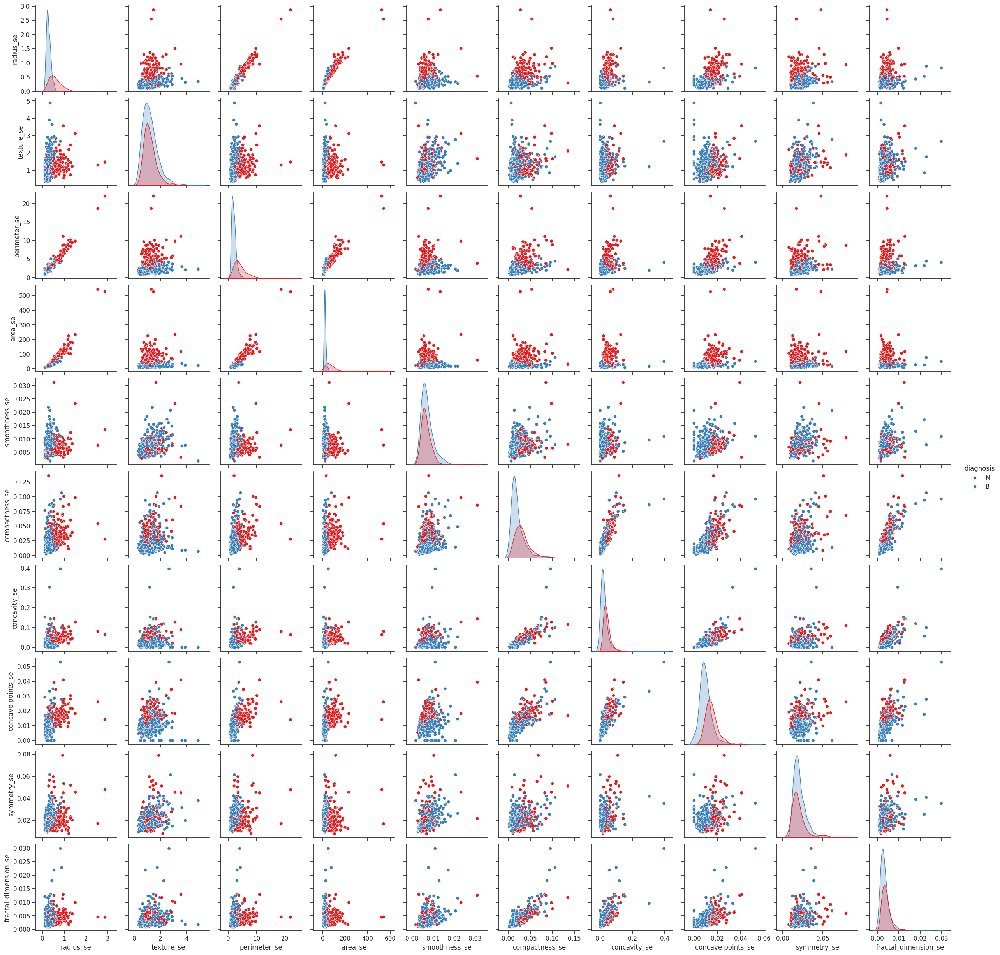

In [67]:
sns.set_theme(style="ticks")

sns.pairplot(df_se, hue="diagnosis",  palette='Set1')

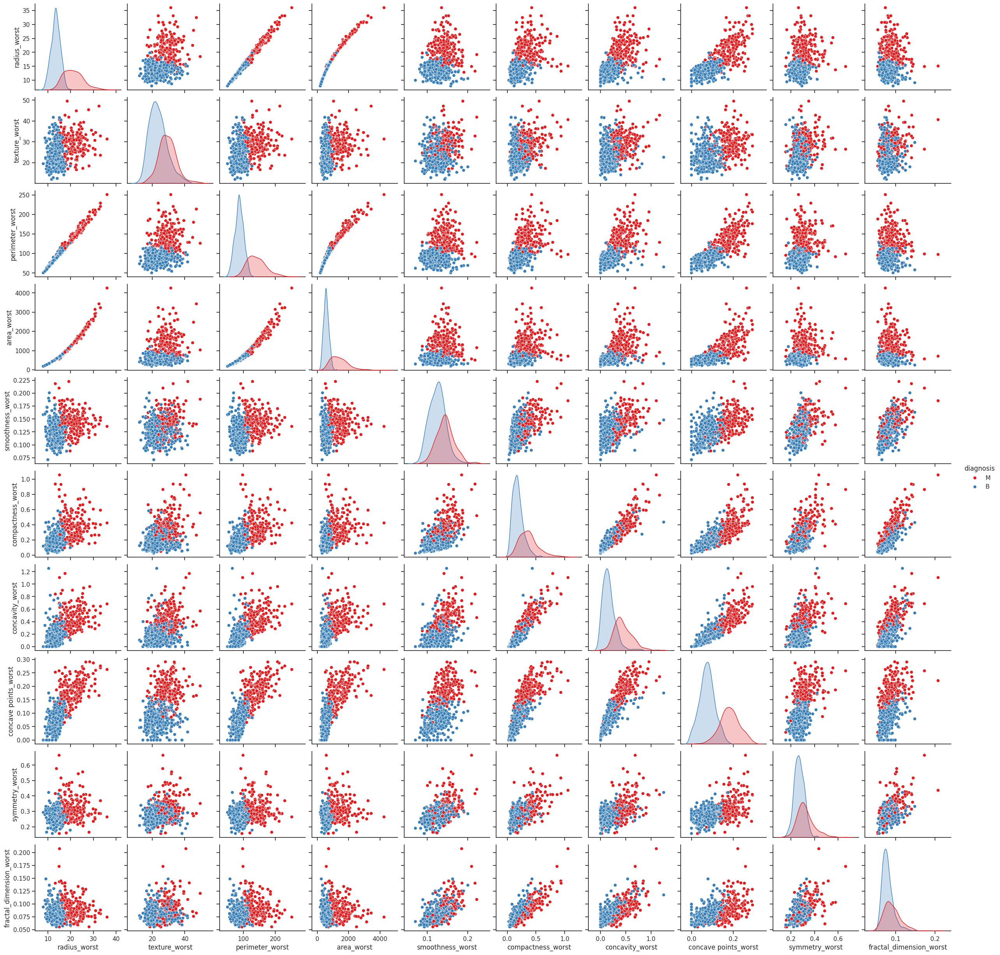

In [68]:
sns.set_theme(style="ticks")

sns.pairplot(df_worst, hue="diagnosis",  palette='Set1')

O pairplot exibe gráficos de dispersão e é uma ferramenta visual que permite explorar as relações entre várias variáveis do conjunto de dados e através delas, podemos verificar a alta correlação de algumas variáveis que já eram esperadas, como radio, perímetro e área, tanto na média, quanto no erro-padrão e "worst".

In [69]:
df['diagnosis'] = df['diagnosis'].map({'B' : 0, 'M' : 1})

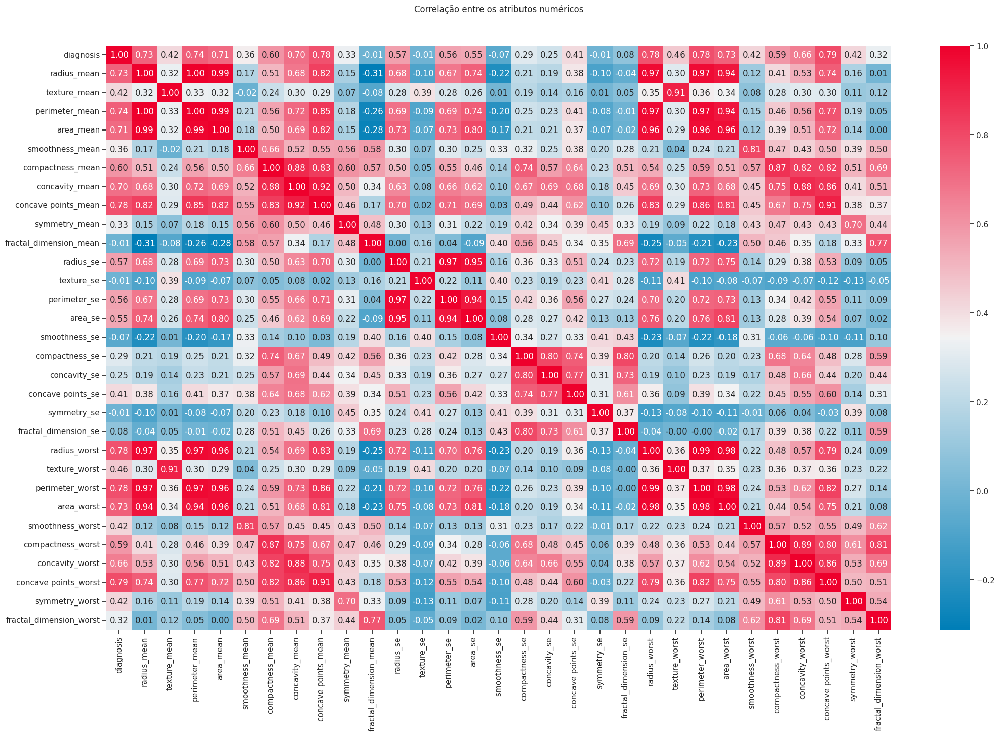

In [70]:
cmap = sns.diverging_palette(
    h_neg=240,
    h_pos=10,
    s=100,
    as_cmap=True,
)

plt.figure(figsize=(25,15))
sns.heatmap(df.corr(), fmt = ".2f", annot = True, cmap = cmap)
plt.title('Correlação entre os atributos numéricos', y= 1.05)
plt.show()

Conforme esperado, medidas, como raio e área, possuem um coeficiente de correlação altíssimo e positivo entre si.

Também foi possível verificar que não há correlações negativas muito fortes.

# 4. Pré-processamento de dados

Agora iremos tratar valores outliers, pois eles podem distorcer as estatísticas descritivas e afetar negativamente os resultados de modelos de aprendizado de máquina. Isso será feito definindo um limite superior e inferior com base na média e o desvio padrão

In [71]:
df_out = df.copy()

In [72]:
# Threshold value to define the range for identifying outliers
threshold = 3

# Loop through all columns in the DataFrame, excluding the diagnosis
for column in df_out.loc[:, ~df_out.columns.isin(['diagnosis'])]:

    # Mean and STD of the column
    mean = df_out[column].mean()
    std = df_out[column].std()

    # Lower and Upper limits
    lower_limit = mean - threshold * std
    upper_limit = mean + threshold * std

    # Remove outliers
    df_out = df_out[(df[column] >= lower_limit) & (df_out[column] <= upper_limit)]

In [73]:
# Dimensões do dataset com outliers
linhas, atributos = df.shape
print(f'O dataset filtrado sem outliers possui {linhas} instâncias e {atributos} atributos')

# Dimensões do dataset sem outliers
linhas, atributos = df_out.shape
print(f'O dataset filtrado sem outliers possui {linhas} instâncias e {atributos} atributos')

O dataset filtrado sem outliers possui 569 instâncias e 31 atributos
O dataset filtrado sem outliers possui 427 instâncias e 31 atributos


Além do tratamento de outliers realizado acima, as seguintes etapas de um pré-processamento foram avaliadas e identificadas que não se aplicam a este estudo:

- Unidades de medida: As unidades não são evidenciadas.
- Valores faltantes: Não há missings, como já verificado.

# 5. Modelagem e treinamento

### 5.1 Escolha do modelo, treinamento e avaliação

Com o objetivo de evitar o overfitting (se o modelo só for avaliado nos dados de treino, ele pode "decorar" estes dados) e avaliar a performance real do modelo, separaremos agora a cópia do dataset em conjuntos de treino e teste, sendo 80% destinado ao conjunto de treino.

Em seguida, seguiremos com a realização da validação cruzada, técnica usada para avaliar a capacidade de generalização de um modelo, de forma que ele seja testado com todos os dados do dataset.

Assim, vamos criar um objeto KFold para dividir os dados em 10 (k) subconjuntos. Em cada rodada, um dos subconjuntos é utilizado como conjunto de teste, enquanto os subconjuntos restantes são combinados em um único conjunto de treino. Esse processo será repetido 10 vezes, resultando na geração e avaliação de 10 modelos, cujas avaliações serão consolidadas por meio da média.

In [74]:
# Preparação dos dados
# criando uma cópia do dataframe original

bcancer = df_out.copy()

# Separação dos atributos de entrada e os rótulos de dados em X e y respectivamente e em bases de treino e teste (holdout)
X = bcancer.drop('diagnosis', axis = 1)
y = bcancer['diagnosis'] # target

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# Criando os folds para a validação cruzada. O particionamento será em 10 , shuffle=True garante que os dados sejam embaralhados antes de serem divididos em subconjuntos e o random_state=7 garante que a divisão seja reproduzível.
scoring = 'accuracy'
num_particoes = 10
kfold = KFold(n_splits=num_particoes, shuffle=True, random_state=7)

Abaixo, realizaremos a modelagem e avaliação de diferentes algoritmos de classificação usando validação cruzada.

- O primeiro algorítmo escolhido foi "LR", **Regressão Logística**, por ser um modelo de classificação binária, ou seja, é utilizado para estimar valores discretos (como 0/1, sim/não e verdadeiro/falso). A LR é rápida e muito eficiente para problemas com duas classes (como "benigno" e "maligno"). Ela calcula a probabilidade de uma amostra pertencer a uma classe e, com base em um limiar, decide qual classe atribuir.

- O segundo algorítmo avaliado será o **K-Nearest Neighbors** (KNN), por ser simples e eficaz, principalmente com dados contínuos. Ele classifica uma nova amostra com base nos k vizinhos mais próximos no espaço de atributos. Por isso, como foi possível verificar na etapa de análise de dados que há uma relação evidente entre as características e a classe, o KNN foi um dos modelos escolhidos.

- As **Árvores de Decisão (Classificação)** são modelos fáceis de entender e interpretar, que utilizam as características dos dados para formar uma estrutura em árvore, onde cada ramificação representa uma regra de decisão. Dessa forma, os dados são transformados em um conjunto de regras que ajudam a tomar decisões. Por funcionarem bem em datasets menores e ser uma boa escolha para classificação binária com variáveis contínuas, elas farão parte dos modelos a ser avaliados.

- O **Naive Bayes** pode ser muito eficaz com pequenos conjuntos de dados. Como ele se baseia em uma abordagem probabilística, ele pode funcionar bem mesmo quando a quantidade de dados de treinamento é limitada. Isso ocorre porque o modelo faz suposições simples sobre a independência das variáveis, o que permite que ele aprenda rapidamente a partir de poucos dados. Além disso,ele é bem adaptado a cenários com alta dimensionalidade, ou seja, quando o número de atributos (features).

- O SVM (**Support Vector Machines**) é um dos algoritmos mais efetivos para classificação e pode ser aplicado em dados lineares ou não lineares. Ele busca encontrar um hiperplano de separação que maximize a distância entre os pontos das duas classes, sendo capaz de generalizar melhor para novos dados. O SVM é especialmente eficaz quando o número de atributos ou características é grande em relação ao número de amostras e quando a separação entre as classes é relativamente clara, como nosso dataset.

--

Em seguida, iremos criar os ensembles, que são técnicas de aprendizado de máquina que combinam múltiplos modelos para melhorar o desempenho de uma tarefa de classificação e adiciona-los à lista de modelos. São eles: Bagging, Random Forest, Extra Tree Classifier, Ada Boost Classifier, Gradient Boosting Classifier e Voting Classifier.




LR: 0.955966 (0.042141)
KNN: 0.938319 (0.044570)
CART: 0.935378 (0.036817)
NB: 0.955966 (0.035452)
SVM: 0.926555 (0.069964)
Bagging: 0.953025 (0.023594)
RF: 0.953025 (0.032798)
ET: 0.953025 (0.037706)
Ada: 0.959076 (0.032396)
GB: 0.961849 (0.029585)
Voting: 0.961849 (0.034947)


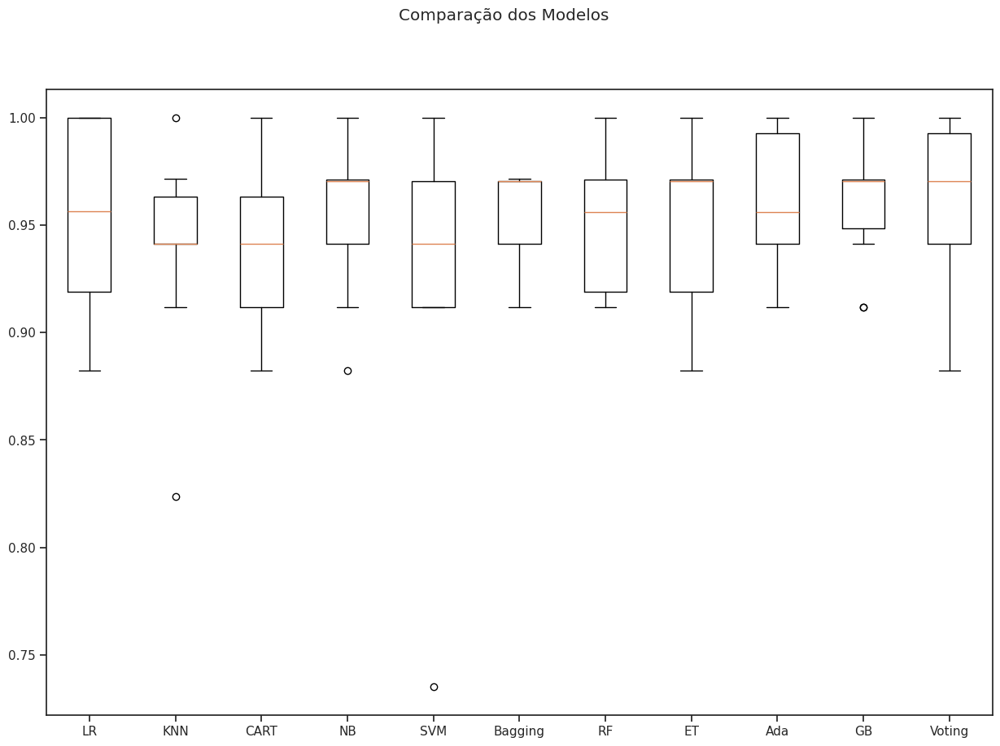

In [75]:
# Criaremos listas para armazenar os modelos, os resultados e os nomes dos modelos. Em seguida, os modelos LR, KNN, CART, NB e SVM foram preparados e adicionados na lista 'models' e com um laço for, cada um dos modelos foi avaliado. Para finalizar, foi utilizado o Boxplot de comparação dos modelos

np.random.seed(7) # definindo uma semente global

# Lista que armazenará os modelos
models = []

# Criando os modelos e adicionando-os na lista de modelos
models.append(('LR', LogisticRegression(max_iter=100))) # Limita a 100 iterações
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))

# Definindo os parâmetros do classificador base para o BaggingClassifier
base = DecisionTreeClassifier()
num_trees = 100
max_features = 3

# Criando os modelos para o VotingClassifier
bases = []
model1 = LogisticRegression(max_iter=100)
bases.append(('logistic', model1))
model2 = DecisionTreeClassifier()
bases.append(('cart', model2))
model3 = SVC()
bases.append(('svm', model3))

# Criando os ensembles e adicionando-os na lista de modelos
models.append(('Bagging', BaggingClassifier(estimator=base, n_estimators=num_trees)))
models.append(('RF', RandomForestClassifier(n_estimators=num_trees, max_features=max_features)))
models.append(('ET', ExtraTreesClassifier(n_estimators=num_trees, max_features=max_features)))
models.append(('Ada', AdaBoostClassifier(n_estimators=num_trees)))
models.append(('GB', GradientBoostingClassifier(n_estimators=num_trees)))
models.append(('Voting', VotingClassifier(bases)))

# Listas para armazenar os resultados
results = []
names = []

# Avaliação dos modelos
for name, model in models:
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

# Boxplot de comparação dos modelos
fig = plt.figure(figsize=(15,10))
fig.suptitle('Comparação dos Modelos')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

Para cada um dos modelos treinados e avaliados com a base de treino, obtivemos a acurácia (métrica de desempenho que mede a proporção de previsões corretas feitas pelo modelo em relação ao total de previsões realizadas) e desvio-padrão a partir da validação cruzada, sem alterações na configuração padrão dos hiperparâmetros do scikit-Learn. O resultado da acurácia de cada modelo foi apresentado, juntamente com um gráfico de boxplot que resume os resultados das dez execuções (relacionadas aos dez folds).

Apesar de todos os modelos gerarem uma boa performance, o Gradient Boosting Classifier e o Voting obtiveram os melhores desempenhos neste treinamento, com acurácias médias mais altas: 0.961849 e 0.961849, respectivamente. O GB obteve um desvio-padrão médio de 0.029585 e o Voting de 0.034947.

Com o Gradient Boosting, devido seu menor valor de desvio-padrão, iremos criar um modelo com todo o cojunto de treino.

In [76]:
# Criando um modelo com todo o conjunto de treino
model = GradientBoostingClassifier()
model.fit(X_train, y_train)

# Fazendo as predições com o conjunto de teste
predictions = model.predict(X_test)

# Estimando a acurácia no conjunto de teste
print(accuracy_score(y_test, predictions))

0.8953488372093024


In [77]:
# Resumo de várias métricas de desempenho para um modelo de classificação
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.92      0.94      0.93        64
           1       0.81      0.77      0.79        22

    accuracy                           0.90        86
   macro avg       0.87      0.86      0.86        86
weighted avg       0.89      0.90      0.89        86



Acima, foi criado um novo modelo utilizando o Gradient Boosting Classifier, treinado com toda a base de treinamento. Dessa forma, o modelo treinado foi utilizado para realizar predições no conjunto de teste, e em seguida, foi calculada a acurácia das predições em relação às classes verdadeiras do conjunto de teste.

O modelo obteve uma acurácia de 0.8953, o que demonstra um desempenho bastante positivo para o problema de classificação, porém, o recall de 77% para a classe 1 (maligno) indica uma performance não tão boa para o nosso estudo. Mais a frente irei entrar em detalhes sobre a importancia desta métrica de avaliação para o dado estudo.



### 5.2 Pipeline para criar e avaliar os modelos através da validação cruzada com os dados padronizados e normalizados

Em seguida realizaremos o mesmo processo, mas utilizando a biblioteca Pipeline para criar e avaliar os modelos através da validação cruzada com os dados padronizados e normalizados e comparar o seu resultado com os modelos treinados com o dataset original. É esperado que os dados normalizados desempenhem melhores resultados, pois nosso conjunto de dados possui variáveis com escalas diferentes, podendo aprimorar algorítmos que são sensíveis à escala, como KNN e SVM.

LR-orig: 0.956 (0.042)
KNN-orig: 0.938 (0.045)
CART-orig: 0.935 (0.037)
NB-orig: 0.956 (0.035)
SVM-orig: 0.927 (0.070)
Bag-orig: 0.953 (0.024)
RF-orig: 0.953 (0.033)
ET-orig: 0.953 (0.038)
Ada-orig: 0.959 (0.032)
GB-orig: 0.962 (0.030)
Vot-orig: 0.962 (0.035)
LR-padr: 0.968 (0.040)
KNN-padr: 0.959 (0.035)
CART-padr: 0.935 (0.032)
NB-padr: 0.953 (0.035)
SVM-padr: 0.965 (0.045)
Bag-padr: 0.962 (0.030)
RF-padr: 0.959 (0.038)
ET-padr: 0.959 (0.030)
Ada-padr: 0.959 (0.032)
GB-padr: 0.959 (0.030)
Vot-padr: 0.971 (0.037)
LR-norm: 0.965 (0.034)
KNN-norm: 0.956 (0.038)
CART-norm: 0.935 (0.034)
NB-norm: 0.953 (0.035)
SVM-norm: 0.968 (0.045)
Bag-norm: 0.962 (0.030)
RF-norm: 0.953 (0.035)
ET-norm: 0.959 (0.038)
Ada-norm: 0.959 (0.032)
GB-norm: 0.959 (0.030)
Vot-norm: 0.968 (0.036)


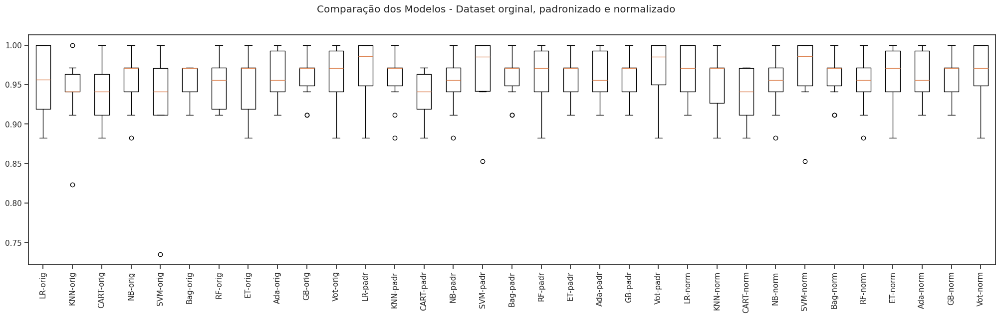

In [78]:
# Para dados normalizados

np.random.seed(7) # definindo uma semente global para este bloco

# Listas para armazenar os armazenar os pipelines e os resultados para todas as visões do dataset
pipelines = []
results = []
names = []

# Criando os elementos do pipeline

# Algoritmos que serão utilizados
reg_log = ('LR', LogisticRegression(max_iter=100))
knn = ('KNN', KNeighborsClassifier())
cart = ('CART', DecisionTreeClassifier())
naive_bayes = ('NB', GaussianNB())
svm = ('SVM', SVC())
bagging = ('Bag', BaggingClassifier(estimator=base, n_estimators=num_trees))
random_forest = ('RF', RandomForestClassifier(n_estimators=num_trees, max_features=max_features))
extra_trees = ('ET', ExtraTreesClassifier(n_estimators=num_trees, max_features=max_features))
adaboost = ('Ada', AdaBoostClassifier(n_estimators=num_trees))
gradient_boosting = ('GB', GradientBoostingClassifier(n_estimators=num_trees))
voting = ('Voting', VotingClassifier(bases))

# Transformações que serão utilizadas
standard_scaler = ('StandardScaler', StandardScaler())
min_max_scaler = ('MinMaxScaler', MinMaxScaler())

# Montando os pipelines

# Dataset original
pipelines.append(('LR-orig', Pipeline([reg_log])))
pipelines.append(('KNN-orig', Pipeline([knn])))
pipelines.append(('CART-orig', Pipeline([cart])))
pipelines.append(('NB-orig', Pipeline([naive_bayes])))
pipelines.append(('SVM-orig', Pipeline([svm])))
pipelines.append(('Bag-orig', Pipeline([bagging])))
pipelines.append(('RF-orig', Pipeline([random_forest])))
pipelines.append(('ET-orig', Pipeline([extra_trees])))
pipelines.append(('Ada-orig', Pipeline([adaboost])))
pipelines.append(('GB-orig', Pipeline([gradient_boosting])))
pipelines.append(('Vot-orig', Pipeline([voting])))

# Dataset Padronizado
pipelines.append(('LR-padr', Pipeline([standard_scaler, reg_log])))
pipelines.append(('KNN-padr', Pipeline([standard_scaler, knn])))
pipelines.append(('CART-padr', Pipeline([standard_scaler, cart])))
pipelines.append(('NB-padr', Pipeline([standard_scaler, naive_bayes])))
pipelines.append(('SVM-padr', Pipeline([standard_scaler, svm])))
pipelines.append(('Bag-padr', Pipeline([standard_scaler, bagging])))
pipelines.append(('RF-padr', Pipeline([standard_scaler, random_forest])))
pipelines.append(('ET-padr', Pipeline([standard_scaler, extra_trees])))
pipelines.append(('Ada-padr', Pipeline([standard_scaler, adaboost])))
pipelines.append(('GB-padr', Pipeline([standard_scaler, gradient_boosting])))
pipelines.append(('Vot-padr', Pipeline([standard_scaler, voting])))

# Dataset Normalizado
pipelines.append(('LR-norm', Pipeline([min_max_scaler, reg_log])))
pipelines.append(('KNN-norm', Pipeline([min_max_scaler, knn])))
pipelines.append(('CART-norm', Pipeline([min_max_scaler, cart])))
pipelines.append(('NB-norm', Pipeline([min_max_scaler, naive_bayes])))
pipelines.append(('SVM-norm', Pipeline([min_max_scaler, svm])))
pipelines.append(('Bag-norm', Pipeline([min_max_scaler, bagging])))
pipelines.append(('RF-norm', Pipeline([min_max_scaler, random_forest])))
pipelines.append(('ET-norm', Pipeline([min_max_scaler, extra_trees])))
pipelines.append(('Ada-norm', Pipeline([min_max_scaler, adaboost])))
pipelines.append(('GB-norm', Pipeline([min_max_scaler, gradient_boosting])))
pipelines.append(('Vot-norm', Pipeline([min_max_scaler, voting])))

# Executando os pipelines
for name, model in pipelines:
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %.3f (%.3f)" % (name, cv_results.mean(), cv_results.std()) # formatando para 3 casas decimais
    print(msg)

# Boxplot de comparação dos modelos
fig = plt.figure(figsize=(25,6))
fig.suptitle('Comparação dos Modelos - Dataset orginal, padronizado e normalizado')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names, rotation=90)
plt.show()

Conforme esperado, os modelos de KNN e SVM normalizados obtiveram uma melhor acurácia, quando comparado com os dados originais.

Porém, o melhor modelo, de acordo com as acurácias, foi com os dados padronizados. O modelo de ensemble do tipo Voting obteve o melhor desempenho neste treinamento, com 0.971 de acurácia e 0.037 de desvio-padrão.



### 5.3. Recursos avançados

O Voting Classifier é um modelo de ensemble que combina as previsões de vários modelos (classificadores) para fazer uma previsão final, baseando-se no voto da maioria (no caso de hard voting) ou na média das probabilidades (no caso de soft voting). Ou seja, pode ser mais difícil interpretar, além de trazer uma dificuldade computacional para um estudo mais simples, como este é.

Outros algorítmos menos complexos trouxeram acurárias médias muito semelhantes e
iremos agora utilizar a biblioteca Grid Search para executar a otimização dos hiperparâmetros de alguns deles.

In [79]:
# Tuning do KNN

np.random.seed(7) # definindo uma semente global para este bloco

pipelines = []

# Definindo os componentes do pipeline
knn = ('KNN', KNeighborsClassifier())
standard_scaler = ('StandardScaler', StandardScaler())
min_max_scaler = ('MinMaxScaler', MinMaxScaler())

pipelines.append(('knn-orig', Pipeline(steps=[knn])))
pipelines.append(('knn-padr', Pipeline(steps=[standard_scaler, knn])))
pipelines.append(('knn-norm', Pipeline(steps=[min_max_scaler, knn])))

param_grid = {
    'KNN__n_neighbors': [1,3,5,7,9,11,13,15,17,19,21],
    'KNN__metric': ["euclidean", "manhattan", "minkowski"],
}

# Prepara e executa o GridSearchCV
for name, model in pipelines:
    grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scoring, cv=kfold)
    grid.fit(X_train, y_train)
    # imprime a melhor configuração
    print(" %s - Melhor: %f usando %s" % (name, grid.best_score_, grid.best_params_))

 knn-orig - Melhor: 0.947143 usando {'KNN__metric': 'euclidean', 'KNN__n_neighbors': 11}
 knn-padr - Melhor: 0.961849 usando {'KNN__metric': 'euclidean', 'KNN__n_neighbors': 3}
 knn-norm - Melhor: 0.961849 usando {'KNN__metric': 'euclidean', 'KNN__n_neighbors': 3}


O KNN possui dois hiperparâmetros principais: o número de vizinhos mais próximos (K) e a medida de distância. Acima foi confirmado que os melhores resultados do modelo com KNN correspondem ao aos dados padronizados ou normalizados, com 0.961849 de acurácia, com a distância euclidiana e k = 3.

In [80]:
# Tuning do Naive Bayes

np.random.seed(7) # definindo uma semente global para este bloco

pipelines = []

# Definindo os componentes do pipeline
naive_bayes = ('NB', GaussianNB())
standard_scaler = ('StandardScaler', StandardScaler())
min_max_scaler = ('MinMaxScaler', MinMaxScaler())


pipelines.append(('nb-orig', Pipeline(steps=[naive_bayes])))
pipelines.append(('nb-padr', Pipeline(steps=[standard_scaler, naive_bayes])))
pipelines.append(('nb-norm', Pipeline(steps=[min_max_scaler, naive_bayes])))

# Definindo o grid de hiperparâmetros a ser testado
param_grid = {
    'NB__var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1]  # Variando o valor do suavizamento da variância
}

# Prepara e executa o GridSearchCV
for name, model in pipelines:
    grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scoring, cv=kfold)
    grid.fit(X_train, y_train)
    # Imprime a melhor configuração
    print("  %s - Melhor: %f usando %s" % (name, grid.best_score_, grid.best_params_))

  nb-orig - Melhor: 0.955966 usando {'NB__var_smoothing': 1e-09}
  nb-padr - Melhor: 0.953025 usando {'NB__var_smoothing': 1e-09}
  nb-norm - Melhor: 0.953025 usando {'NB__var_smoothing': 1e-09}


Para o algorítmo Naive Bayes utilizamos o hiperparâmetro que controla a suavização da variância e o melhor resultado encontrado foi utilizando os dados originais, com uma acurácia de 0.955966 valor de suavizamento da variância 1e-09.

In [81]:
# Tuning do Logistic Regression

np.random.seed(7) # definindo uma semente global para este bloco

pipelines = []

# Definindo os componentes do pipeline
log_reg = ('log_reg', LogisticRegression(max_iter=200))
standard_scaler = ('StandardScaler', StandardScaler())
min_max_scaler = ('MinMaxScaler', MinMaxScaler())


pipelines.append(('lr-orig', Pipeline(steps=[log_reg])))
pipelines.append(('lr-padr', Pipeline(steps=[standard_scaler, log_reg])))
pipelines.append(('lr-norm', Pipeline(steps=[min_max_scaler, log_reg])))

# Definindo o grid de hiperparâmetros a ser testado
param_grid = {
    'log_reg__penalty': ['l2', 'l1'],  # Tipo de penalização
    'log_reg__C': [0.01, 0.1, 1, 10, 50, 100],  # Parâmetro de regularização
    'log_reg__solver': ['liblinear'],  # Algoritmo de otimização
    'log_reg__max_iter': [100, 150, 200]  # Número de iterações
}

# Prepara e executa o GridSearchCV
for name, model in pipelines:
    grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scoring, cv=kfold)
    grid.fit(X_train, y_train)
    # Imprime a melhor configuração
    print("  %s - Melhor: %f usando %s" % (name, grid.best_score_, grid.best_params_))

  lr-orig - Melhor: 0.970672 usando {'log_reg__C': 100, 'log_reg__max_iter': 100, 'log_reg__penalty': 'l1', 'log_reg__solver': 'liblinear'}
  lr-padr - Melhor: 0.970672 usando {'log_reg__C': 1, 'log_reg__max_iter': 100, 'log_reg__penalty': 'l1', 'log_reg__solver': 'liblinear'}
  lr-norm - Melhor: 0.970588 usando {'log_reg__C': 50, 'log_reg__max_iter': 100, 'log_reg__penalty': 'l2', 'log_reg__solver': 'liblinear'}


Os melhores resultados com o GridSearch para o algoritmo Logistic Regression foram obtidos através dos dados originais e padronizados, com a mesma acurácia (0.970672).

Como a acurácia dos dois modelos é mesma, e pelo fato de que os dados do dataset são simples (sem muito ruído), o modelo com os dados padrozinados, com C = 1 provavelmente será a melhor opção, pois possui uma regularização intermediária, em que não há muita penalidade ou liberdade para ajustar os dados ao treino.

Por isso, seguiremos com o modelo de Regressão Logística, com os dados padronizados, como o melhor modelo treinado, seguindo o conjunto de hiperparâmetros evidenciados abaixo:

- C: 1 (parâmetro de regularização)
- max_iter: 100 (número de iterações máximas para convergência)
- penalty: 'l1' (regularização L1, que promove sparsidade, ou seja, alguns coeficientes são reduzidos a zero)
- solver: 'liblinear' (algoritmo de otimização que é eficiente para datasets pequenos e médios, especialmente com penalização L1)


# 6. Avaliação de Resultados

In [82]:
# Avaliação do modelo com o conjunto de testes

# Preparação do modelo
scaler = StandardScaler().fit(X_train) # ajuste do scaler com o conjunto de treino
rescaledX = scaler.transform(X_train) # aplicação da padronização no conjunto de treino
model = LogisticRegression(penalty = 'l1', C = 1, max_iter = 100, solver = "liblinear") # ajustando otimização de hiperparâmetros
model.fit(rescaledX, y_train) # Criando um modelo com todo o conjunto de treino

# Estimativa da acurácia no conjunto de teste
rescaledTestX = scaler.transform(X_test) # aplicação da padronização no conjunto de teste
predictions = model.predict(rescaledTestX)
print(accuracy_score(y_test, predictions))

# Exibindo o relatório de classificação
print(f"Classification report :\n {metrics.classification_report(y_test,predictions)} \n")

0.9534883720930233
Classification report :
               precision    recall  f1-score   support

           0       0.95      0.98      0.97        64
           1       0.95      0.86      0.90        22

    accuracy                           0.95        86
   macro avg       0.95      0.92      0.94        86
weighted avg       0.95      0.95      0.95        86
 



Após a avaliação do modelo com o conjunto de testes, obtivemos uma Acurácia de 0.9534, que é a porcentagem de classificações corretas.

Através do relatório de classificação, foi possível visualizar algumas métricas de avaliação.

Para o presente estudo, a Revocação (ou Sensibilidade) é uma métrica de avaliação muito importante, pois indica a proporção de exemplos positivos que o modelo conseguiu identificar corretamente. Em um problema de diagnóstico médico, é melhor que o modelo capture todos os casos de tumores malignos, mesmo que alguns benignos sejam classificados incorretamente como malignos.

O modelo identificou corretamente 98% de todas as instâncias reais da classe 0 (benigno), o que significa que 98% das instâncias reais de 0 foram corretamente identificadas pelo modelo. Esse é um valor muito alto, indicando que o modelo é muito eficaz em identificar tumores benignos.

Em contrapartida, o modelo identificou corretamente cerca de 86% das instâncias reais da classe 1 (maligno). Esse valor é um pouco menor em comparação com a classe 0, indicando que o modelo perdeu 14% dos casos de tumores malignos, classificando-os erroneamente como benignos.

In [83]:
# Exibindo a matriz de confusão
conf_matrix = confusion_matrix(y_test, predictions)
print("Matriz de Confusão:")
print(conf_matrix)

Matriz de Confusão:
[[63  1]
 [ 3 19]]


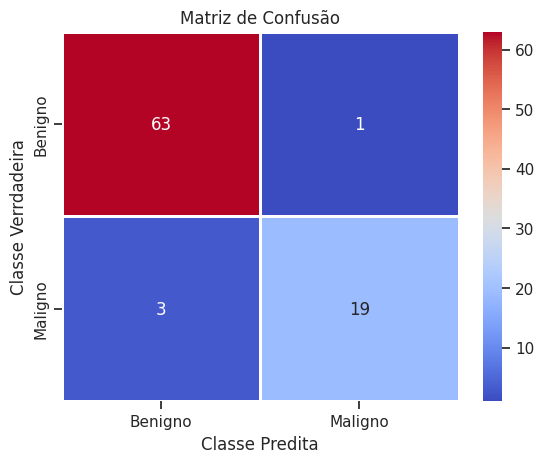

In [84]:
# Criando o heatmap
sns.heatmap(conf_matrix, cmap='coolwarm', annot=True, linewidth=1, fmt='d',
            xticklabels=['Benigno', 'Maligno'], yticklabels=['Benigno', 'Maligno'])

# Adicionando título e rótulos
plt.title('Matriz de Confusão')
plt.xlabel('Classe Predita')
plt.ylabel('Classe Verrdadeira')

plt.show()

A partir da matriz de consusão ilustrada em um heatmap, podemos confirmar que:

- O modelo corretamente previu 63 casos de tumores benignos (classe 0) como benignos. (Verdadeiro Negativo)
- O modelo incorretamente previu 1 caso de tumor benigno como maligno. Esse é um erro onde o modelo classifica erroneamente um tumor benigno como maligno. (1 (Falso Positivo):
- O modelo incorretamente previu 3 casos de tumor maligno como benigno. Este erro é o mais grave para o nosso estudo. (3 (Falso Negativo):
- O modelo corretamente previu 19 casos de tumores malignos (classe 1) como malignos. (Verdadeiro Positivo):

Com o objetivo de tentar melhorar o Recall da classe 1, iremos ajustar os pesos das classes no modelo, para que ele "pese" mais os exemplos da classe 1, tentando melhorar a detecção de tumores malignos.

In [85]:
# Preparação do modelo
scaler = StandardScaler().fit(X_train) # ajuste do scaler com o conjunto de treino
rescaledX = scaler.transform(X_train) # aplicação da padronização no conjunto de treino

# Definindo o modelo com pesos de classe ajustados
model_com_class_weight = LogisticRegression(penalty='l1', C=1, max_iter=100, solver='liblinear', class_weight='balanced')

# Ajustando o modelo
model_com_class_weight.fit(rescaledX, y_train)

# Fazendo previsões
predictions = model_com_class_weight.predict(rescaledTestX)

print(f"Acurácia: {accuracy_score(y_test, predictions)}")
print(f"Recall (Classe 1): {recall_score(y_test, predictions)}")

Acurácia: 0.9534883720930233
Recall (Classe 1): 0.8636363636363636


Utilizamos o class_weight='balanced', em que o modelo automaticamente ajustou os pesos das classes com base no número de amostras de cada classe. Como a classe 1 (tumores malignos) é menor que a classe 0 (benignos), os pesos da classe 1 foram aumentados.

Porém, com o ajuste de pesos, a acurácia e a revocação se mantiveram as mesmas.

# 7. Conclusão

Este projeto teve como objetivo utilizar ferramentas de machine learning para um problema de classificação, buscando os melhores modelos, que fizessem mais sentido, para previr se um câncer é benigno ou maligno. Dessa forma, iniciou-se a análise de dados a partir das características dos tumores, como média do raio, textura e simetria e da target “diagnosis”. Nesta etapa, foi possível visualizar através de gráficos a distribuição das variáveis e identificar a possibilidade de, mais a frente, realizar a aplicação de técnicas usadas para ajustar as escalas, como normalização e padronização, bem como suas correlações.


Em seguida, foi realizado o tratamento de outliers e, com o dataset preparado para a modelagem utilizando a validação cruzada, foram escolhidos diferentes algoritmos de classificação, bem como ensembles, como Bagging e Random Forest.  Após a avaliação dos modelos no conjunto separado para treino, mantendo os parâmetros padrões de cada algoritmo, identificamos uma boa performance para praticamente todos os modelos escolhidos, sendo o Gradient Boosting e Voting os modelos com as mais altas acurácias médias. Seguindo com o GB, foi criado um modelo com todo o conjunto de treino, para posterior predições com o conjunto de testes, levando a uma boa acurácia e uma revocação de 77% para a classe 1 (maligno).


Com o objetivo de alcançar melhores resultados, foi utilizada a biblioteca Pipeline para criar e avaliar novos modelos através da validação cruzada, mas agora, também com dados padronizados e normalizados. Desta vez, o ensemble do tipo Voting obteve o melhor desempenho, porém, pela dificuldade de interpretação e dificuldade computacional para um estudo simples como este, outros algoritmos menos complexos, com acurácias semelhantes, foram escolhidos para dar continuidade ao projeto. Dessa forma, utilizando a biblioteca Grid Search para executar a otimização dos hiperparâmetros, os algoritmos KNN, Naive Bayes e Linear Regression foram escolhidos, com este último alçando os melhores resultados.

Com o algoritmo Linear Regression definido para a avaliação final, foi criado um modelo com o conjunto todo de treino e, utilizando o conjunto de testes, o modelo obteve uma acurácia de 0.9534. Para a análise do desempenho, além da acurácia, a revocação foi escolhida como métrica de avaliação devido sua importância em um contexto de diagnóstico médico. O modelo obteve um excelente desempenho na identificação de tumores benignos (classe 0), com um recall (revocação) de 98%. No entanto, sua capacidade de identificar tumores malignos (classe 1) foi um pouco inferior, com um recall de 86%. Para melhorar essa detecção, os pesos das classes foram ajustados, mas as melhorias foram modestas, com os resultados de acurácia e recall permanecendo praticamente os mesmos.

Considerando os pontos apresentados, o modelo de Regressão Logística, quando treinado com dados padronizados e otimizado através de seus hiperparâmetros, mostrou-se eficaz, com uma acurácia de 0.9534 e resultados satisfatórios de recall, prevendo corretamente 19 casos de tumor maligno e, incorretamente, 3 casos de tumor maligno como benigno. Apesar de não ser o ideal, onde a precisão no diagnóstico é crucial, o desempenho geral do modelo foi satisfatório para um problema de classificação binária e, com outras estratégias de otimização, poderá ser explorado em futuras análises para uma melhor precisão de detecção de tumores malignos.